In [1]:
import os
import pickle
import pandas as pd
import numpy as np

def load_object(filename):
    with open(filename, 'rb') as f:
        return pickle.load(f)

/home/grabeda2/miniconda3/envs/similarity/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
affinity_dict = load_object('/data/grbv/PDBbind/DTI5_general_affinity_dict.pkl')
len(affinity_dict)

19443

In [3]:
casf2016_dir = '/data/grbv/PDBbind/DTI_5/input_graphs_esm2_t6_8M/test_data/casf2016'
casf2016_complexes = [filename[0:4] for filename in os.listdir(casf2016_dir) if 'graph' in filename]

casf2013_dir = '/data/grbv/PDBbind/DTI_5/input_graphs_esm2_t6_8M/test_data/casf2013'
casf2013_complexes = [filename[0:4] for filename in os.listdir(casf2013_dir) if 'graph' in filename]

train_dir = '/data/grbv/PDBbind/DTI_5/input_graphs_esm2_t6_8M/training_data'
train_complexes = [filename[0:4] for filename in os.listdir(train_dir) if 'graph' in filename]

In [4]:
# # Generate sequence dict with all complexes

# sequence_dict = {}
# save_path = '/data/grbv/PDBbind/DTI5c1_sequence_dict.pkl'


# data_dir = '/data/grbv/PDBbind/DTI5_input_data_processed'

# complexes = [folder for folder in os.listdir(data_dir) if len(folder)==4 and folder[0].isdigit()]
# for compl in complexes: 

#     in_dataset = False
#     if compl in train_complexes: in_dataset=True
#     elif compl in casf2013_complexes: in_dataset=True
#     elif compl in casf2016_complexes: in_dataset=True

#     if in_dataset:
#         path = os.path.join(data_dir, compl)

#         for file in os.scandir(path):
#             if file.name.endswith('protein_dict.pkl'):
#                 id = file.name[0:4]       
#                 protein_dict = load_object(file.path)

#                 seq = ''
#                 for chain in protein_dict:
#                     s = protein_dict[chain]['aa_seq']
#                     seq = seq + s

#                 sequence_dict[id]=seq   

# with open(save_path, 'wb') as fp:
#     pickle.dump(sequence_dict, fp)

In [4]:
sequence_dict = load_object('/data/grbv/PDBbind/DTI5_sequence_dict.pkl')
len(sequence_dict)

19132

In [6]:
# Save sequences as fasta file:

# fasta_file = '/data/grbv/PDBbind/DTI5c1_sequences.fasta'

# with open(fasta_file, 'w') as f:
#     for key in sequence_dict:
#         f.write('>' + key + '\n' + sequence_dict[key] + '\n')

In [5]:
#using mmseqs2 to cluster the sequences
import subprocess

#mmseqs easy-cluster test_data.fasta clusterRes tmp --min-seq-id 0.5 -c 0.8 --cov-mode 1

subprocess.run(['mmseqs', 'easy-cluster', '/data/grbv/PDBbind/DTI5_sequences.fasta', 'clusterRes', 'tmp', '--min-seq-id', '0.8', '-c', '0.8', '--cov-mode', '1'])

easy-cluster /data/grbv/PDBbind/DTI5_sequences.fasta clusterRes tmp --min-seq-id 0.8 -c 0.8 --cov-mode 1 

MMseqs Version:                     	15.6f452
Substitution matrix                 	aa:blosum62.out,nucl:nucleotide.out
Seed substitution matrix            	aa:VTML80.out,nucl:nucleotide.out
Sensitivity                         	4
k-mer length                        	0
Target search mode                  	0
k-score                             	seq:2147483647,prof:2147483647
Alphabet size                       	aa:21,nucl:5
Max sequence length                 	65535
Max results per query               	20
Split database                      	0
Split mode                          	2
Split memory limit                  	0
Coverage threshold                  	0.8
Coverage mode                       	1
Compositional bias                  	1
Compositional bias                  	1
Diagonal scoring                    	true
Exact k-mer matching                	0
Mask residues                

CompletedProcess(args=['mmseqs', 'easy-cluster', '/data/grbv/PDBbind/DTI5_sequences.fasta', 'clusterRes', 'tmp', '--min-seq-id', '0.8', '-c', '0.8', '--cov-mode', '1'], returncode=0)

In [6]:
#lets analyse the clusterRes file
clusterRes = pd.read_csv('clusterRes_cluster.tsv', sep='\t', header=None)
clusterRes.head()


,0,1
0,6mqc,6mqc
1,2q3z,2q3z
2,5owc,5owc
3,5owc,4uy1
4,5owc,6g5j


In [7]:
'''All members of the clustering are listed line by line. 
Each cluster is a consecutive block in the file. The first column always contains the representative sequence, the second contains the cluster member. For the example the cluster with the representative sequence Q0KJ32 contains four members itself and C0W539, D6KVP9, D1Y890.
 IDs are parsed from the header from the input database (see id parsing from headers).
'''
#lets count the number of clusters and its memebers
print(len(clusterRes[0].unique()), 'number of clusters')

3464 number of clusters


In [8]:
#lets count the number of sequences in each cluster
clusterRes[0].value_counts()

0
5kr2    438
5doh    420
3kmx    342
2v22    223
2tpi    194
       ... 
3rcd      1
6rz6      1
1h2t      1
3kyg      1
6mqc      1
Name: count, Length: 3464, dtype: int64

In [9]:
value_counts = clusterRes[0].value_counts()

clusters_value_counts = value_counts[value_counts > 1]
clusters_value_counts

0
5kr2    438
5doh    420
3kmx    342
2v22    223
2tpi    194
       ... 
6er4      2
4z2o      2
3zev      2
1e2k      2
4yzn      2
Name: count, Length: 1877, dtype: int64

In [10]:
value_counts = clusters_value_counts.tolist()
print(len(value_counts))
print(np.mean(value_counts))
print(np.median(value_counts))

1877
9.347362812999467
4.0


In [28]:
import csv

with open('clusterRes_cluster.tsv', 'r', newline='') as infile, open('clusterRes_cluster2.tsv', 'w', newline='') as outfile:
    reader = csv.reader(infile, delimiter='\t')
    writer = csv.writer(outfile, delimiter='\t')

    for row in reader:

        # Retrieve the value from the dictionary based on the second column
        id = row[1]

        if id in train_complexes: string = 'training'
        if id in casf2016_complexes: string = 'test    '
        if id in casf2013_complexes: string = 'test    '

        affinity = affinity_dict[id]['log_kd_ki']

        # Add this value as a third column
        row.append(string)
        row.append(affinity)

        
        # Write the modified row to the output file
        writer.writerow(row)

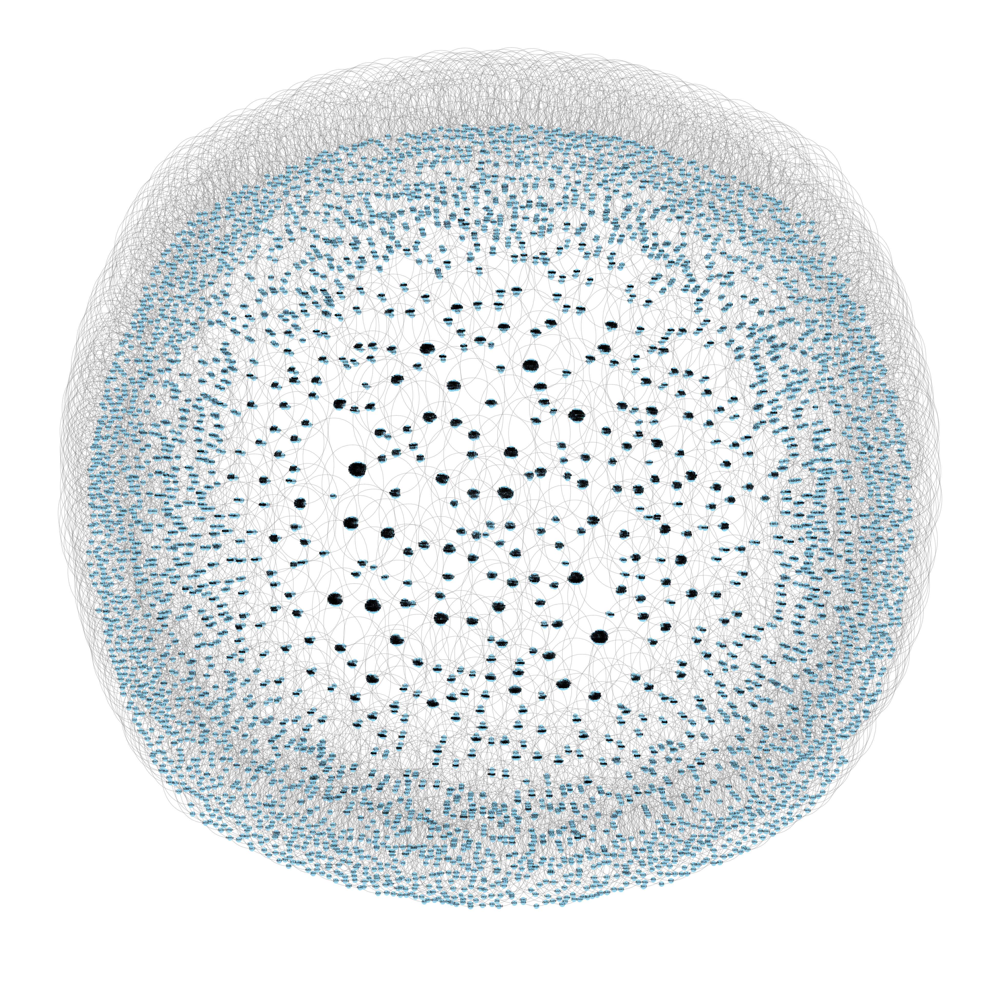

In [29]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Add edges from the DataFrame
for index, row in clusterRes.iterrows():
    G.add_edge(row[0], row[1])

# Set node positions using the spring layout
pos = nx.spring_layout(G)
# Set a clear background
plt.figure(figsize=(50, 50))
plt.gca().set_facecolor('white')

# Draw nodes with adjusted size and color
nx.draw_networkx_nodes(G, pos, node_size=200, node_color='skyblue', alpha=0.8)

# Draw edges with adjusted thickness and color
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5, edge_color='gray')

# Draw labels with adjusted font size
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black')


# Show the plot
plt.axis('off')  # Turn off axis
plt.show()

## Analyse the ligand similarities in the dataset

In [31]:
# Generate Smiles Dict of all Complexes
from rdkit import Chem

save_path = '/data/grbv/PDBbind/DTI5c1_smiles_dict.pkl'

def parse_sdf_file(file_path):
    suppl = Chem.SDMolSupplier(file_path)#, sanitize = False)
    molecules = []
    for mol in suppl:
        if mol is not None:
            molecules.append(mol)
    return molecules

smiles_dict = {}


data_dir = '/data/grbv/PDBbind/DTI5_input_data_processed'

complexes = [folder for folder in os.listdir(data_dir) if len(folder)==4 and folder[0].isdigit()]
for compl in complexes:

    in_dataset = False
    if compl in train_complexes: in_dataset=True
    elif compl in casf2013_complexes: in_dataset=True
    elif compl in casf2016_complexes: in_dataset=True

    if in_dataset:
        path = os.path.join(data_dir, compl)

        for file in os.scandir(path):
            if file.name.endswith('ligand_san.sdf'):
                id = file.name[0:4]
                mol = parse_sdf_file(file.path)
                smiles = Chem.MolToSmiles(mol[0])

                smiles_dict[id] = smiles
                

with open(save_path, 'wb') as fp:
    pickle.dump(smiles_dict, fp)
  

[08:51:33] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:33] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:33] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:33] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:38] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:38] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:40] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:40] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:40] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[08:51:40] WARNING: not removing hydrogen atom with neighbor that has non-tetrahed

In [33]:
smiles_dict = load_object('/data/grbv/PDBbind/DTI5c1_smiles_dict.pkl')

In [34]:
len(smiles_dict)

11276

In [15]:
complex_idx_mapping = {}
index = 0
for key in smiles_dict:
    complex_idx_mapping[key]=index
    index += 1
    

In [16]:
idx_complex_mapping = {}

for key in complex_idx_mapping:
    idx = complex_idx_mapping[key]

    idx_complex_mapping[idx]=key

In [17]:
from FPSim2.io import create_db_file

list_of_smiles = [[smiles_dict[key], complex_idx_mapping[key]] for key in smiles_dict]
create_db_file(list_of_smiles, 'db_file_smiles.h5', 'Morgan', {'radius': 2, 'nBits': 2048})

[11:15:12] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:12] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:12] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:12] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:14] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:14] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:14] Can't kekulize mol.  Unkekulized atoms: 10 11 12 23 24
[11:15:14] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:14] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:14] WARNING: not removing hydrogen atom with neighbor that has non-tetrahedral stereochemistry
[11:15:14] WARNI

In [18]:
from FPSim2 import FPSim2Engine

fp_filename = 'db_file_smiles.h5'
fpe = FPSim2Engine(fp_filename)

In [19]:
complex_idx_mapping['3ao1'], complex_idx_mapping['3ao4']

(18316, 4817)

In [20]:
smiles_dict['3ao1']

'Oc1ccc2c(c1)OCO2'

In [21]:
query = 'Oc1ccc2c(c1)OCO2'
results = fpe.tversky(query, 0.5, 0.5, 0.5, n_workers=1)
results

array([(18316, 1.        ), (  757, 0.6818182 ), ( 7186, 0.6122449 ),
       (14259, 0.6122449 ), (11424, 0.6086956 ), (   35, 0.6       ),
       ( 7633, 0.58536583), (16394, 0.56      ), (18977, 0.55813956),
       ( 1518, 0.5555556 ), ( 4817, 0.53846157), ( 8223, 0.53333336),
       (12845, 0.5283019 ), ( 3375, 0.51282054), (10430, 0.51282054),
       ( 2241, 0.5116279 ), ( 7744, 0.5116279 ), ( 7059, 0.5090909 ),
       (15541, 0.5       ), ( 4686, 0.5       ), ( 1853, 0.5       ),
       ( 8720, 0.5       )],
      dtype={'names': ['mol_id', 'coeff'], 'formats': ['<u4', '<f4'], 'offsets': [4, 8], 'itemsize': 12})

In [22]:
test_smiles = smiles_dict[idx_complex_mapping[18977]]

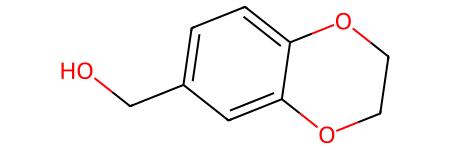

In [23]:
from rdkit import Chem
Chem.MolFromSmiles(test_smiles)

In [24]:
ids = fpe.fps[:, 0]
ids

array([ 1804, 12076,   746, ...,  9405,  1963, 18729], dtype=uint64)

In [25]:
index1 = np.where(ids==18316)[0][0]
index2 = np.where(ids==4817)[0][0]

index1, index2

(1043, 3440)

In [26]:
csr_matrix_tversky = fpe.symmetric_distance_matrix(0.5, n_workers=4, search_type='tversky', a=0.5, b=0.5)
#csr_matrix_tanimoto = fpe.symmetric_distance_matrix(0.4, n_workers=4, search_type='tanimoto')

100%|██████████| 19127/19127 [00:46<00:00, 411.06it/s]


In [27]:
csr_matrix_tversky[1043, 3440]

0.46153843

In [28]:
import matplotlib.pylab as plt
plt.spy(csr_matrix_tanimoto)

NameError: name 'csr_matrix_tanimoto' is not defined